#  Wheels counter
Here I build a tool to classify bikes into 4 classes:
- monocycles
- bicycles
- tricycles
- quadricycles

Basically, we try to count the wheels of the object.
Data are retrieved using the Bing Image Search API.

In [1]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

In [2]:
from fastbook import *
from fastai.vision.widgets import *

In [3]:
key = os.environ.get('AZURE_SEARCH_KEY', '60eb2ab183c24ba4aa8ea1b22103c70e')

In [4]:
key

'60eb2ab183c24ba4aa8ea1b22103c70e'

Let's check if it works:

In [5]:
results = search_images_bing(key, 'monocycle')
ims = results.attrgot('contentUrl')
print(f'# of images found: {len(ims)}')

# of images found: 150


In [6]:
print(ims[0])

https://medias.go-sport.com/media/resized/1300x/catalog/product/15/91/63/78/monocycle-only-one-20-pouces-noir_1_v1.jpeg


In [7]:
dest = 'images/monocycle.jpg'
download_url(ims[0], dest)

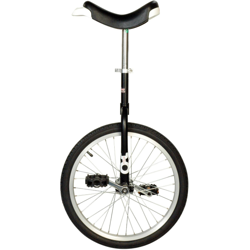

In [8]:
im = Image.open(dest)
im.to_thumb(250,250)

OK, let's now build things ready for building the model on "many" data

In [12]:
base_path = 'bikes2'
bike_types = ['monocycle', 'bicycle', 'tricycle', 'quadricycle']
path = Path(base_path)

In [13]:
type(path)

pathlib.PosixPath

In [14]:
for b in bike_types:
  dest = path/b
  dest.mkdir(exist_ok=True, parents=True)

  results = search_images_bing(key, b)
  download_images(dest, urls=results.attrgot('contentUrl'))

In [15]:
for b in bike_types:
  print(f'# of picures of {b} type: {len((path/b).ls())}')

# of picures of monocycle type: 150
# of picures of bicycle type: 143
# of picures of tricycle type: 145
# of picures of quadricycle type: 150


Now get the actual images and check if they are OK (i.e. if they can be open properly)

In [16]:
fns = get_image_files(path)

In [17]:
fns

(#559) [Path('bikes2/monocycle/00000014.jpg'),Path('bikes2/monocycle/00000122.jpg'),Path('bikes2/monocycle/00000102.jpg'),Path('bikes2/monocycle/00000017.jpg'),Path('bikes2/monocycle/00000010.png'),Path('bikes2/monocycle/00000037.jpg'),Path('bikes2/monocycle/00000029.JPG'),Path('bikes2/monocycle/00000137.jpg'),Path('bikes2/monocycle/00000003.jpg'),Path('bikes2/monocycle/00000142.jpg')...]

Interesting: `fns` has 559 items, but the sum of the items in the folders is 150+143+145+150 = 588. What happened here?

In [18]:
failed = verify_images(fns)
failed

(#7) [Path('bikes2/tricycle/00000003.jpg'),Path('bikes2/tricycle/00000073.jpg'),Path('bikes2/tricycle/00000002.jpg'),Path('bikes2/tricycle/00000100.jpg'),Path('bikes2/tricycle/00000129.jpg'),Path('bikes2/quadricycle/00000031.jpg'),Path('bikes2/bicycle/00000017.jpg')]

In [19]:
failed.map(Path.unlink);

Now use the `DataBlock` API to load the data into `DataLoaders`:

In [20]:
bikes = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=0),
    get_y=parent_label,
    item_tfms=RandomResizedCrop(250, min_scale=0.3)
)

In [21]:
dls = bikes.dataloaders(path)

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


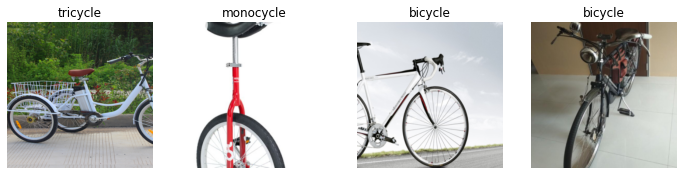

In [22]:
dls.train.show_batch(max_n=4, nrows=1)

Now build the actual model

In [23]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)

In [24]:
learn.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,2.100006,0.960075,0.318182,00:15


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,error_rate,time
0,0.930076,0.698435,0.236364,00:15
1,0.845008,0.611156,0.172727,00:15
2,0.673817,0.651448,0.154545,00:15
3,0.561084,0.639863,0.181818,00:15
4,0.480563,0.608594,0.172727,00:15


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency e

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


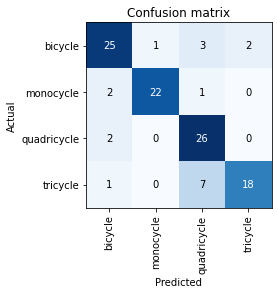

In [25]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

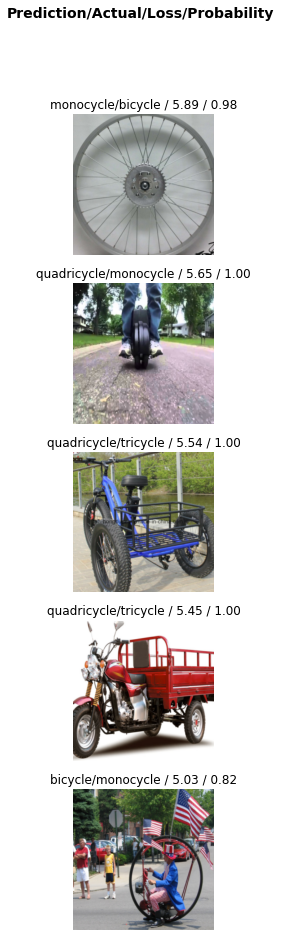

In [26]:
interp.plot_top_losses(5, nrows=5)

Let's now clean the data!

In [27]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [38]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx, cat in cleaner.change():
  if str(cleaner.fns[idx]).split('/')[-1] in [str(i).split('/')[-1] for i in list((path/cat).ls())]:
    print('skipping', str(cleaner.fns[idx]))
    continue
  shutil.move(str(cleaner.fns[idx]), path/cat)

Retrain and re-evaluate:

In [39]:
dls = bikes.dataloaders(path)

learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,1.806454,0.920443,0.303030,00:13


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,error_rate,time
0,0.853667,0.724435,0.262626,00:14
1,0.699712,0.571978,0.191919,00:14
2,0.566993,0.502635,0.181818,00:14
3,0.466138,0.439826,0.151515,00:14
4,0.397270,0.436365,0.151515,00:14


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency e

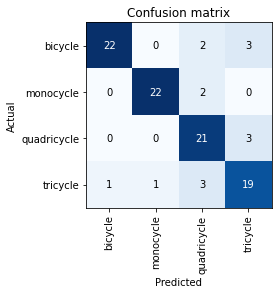

In [40]:
interp2 = ClassificationInterpretation.from_learner(learn)
interp2.plot_confusion_matrix()

Now export the model, so that it can be used elsewhere :)

In [41]:
learn.export()

In [42]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]